# Transit Speed Visualization Concept #

## Load and Clean Bus Data ##

In [1]:
from colour import Color
import folium
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
#Load dataset
bus_data_df = pd.read_csv('10_25_2020.csv') #Too large to upload to github
route_data_df = pd.read_csv('gtfs_trips.csv')

#Preprocessing out duplicates, get speed between each recorded location, remove records with speed below 0 (about 10%)
bus_data_df = bus_data_df.drop_duplicates(subset=['tripid', 'locationtime'])
bus_data_df = bus_data_df.sort_values(['tripid', 'locationtime'])
bus_data_df['prev_tripdistance'] = bus_data_df['tripdistance'].shift(periods=1)
bus_data_df['prev_locationtime'] = bus_data_df['locationtime'].shift(periods=1)
bus_data_df['prev_tripid'] = bus_data_df['tripid'].shift(periods=1)
bus_data_df = bus_data_df.dropna()
bus_data_df = bus_data_df[bus_data_df['tripid'] == bus_data_df['prev_tripid']]
bus_data_df['dist_diff'] = (bus_data_df['tripdistance'] - bus_data_df['prev_tripdistance'])
bus_data_df['time_diff'] = (bus_data_df['locationtime'] - bus_data_df['prev_locationtime']) 
bus_data_df['avg_speed_m_s'] = bus_data_df['dist_diff'] / bus_data_df['time_diff']
bus_data_df = bus_data_df[bus_data_df['avg_speed_m_s'] >= 0]
bus_data_df['avg_speed_m_s'] = bus_data_df['avg_speed_m_s'].round(1)

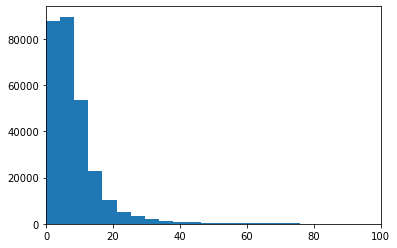

95th Percentile Speed is: 23 meters/sec


In [3]:
#Show the resulting distribution of speeds
plt.hist(bus_data_df['avg_speed_m_s'], bins=1000)
plt.xlim(0,100)
plt.show()
print(f"95th Percentile Speed is: {round(np.percentile(bus_data_df['avg_speed_m_s'], q=95))} meters/sec")

## Load Route Shapes, Assign Average Speeds, and Map Speeds to Colors ##

In [4]:
#Use KCM GTFS data to get route_id for each corresponding trip, then get avg speed for each route
route_data_df = route_data_df[['route_id', 'trip_id']]
map_data = pd.merge(bus_data_df, route_data_df, left_on='tripid', right_on='trip_id')
map_data = map_data.groupby('route_id').mean('avg_speed_m_s')[['avg_speed_m_s']]
data_classes = 5 #number of bins that speed data will be grouped into for coloring

#Read in geojson route geoJson, add a new property for calculated speed values of each feature, keeps array of all speeds
speeds = np.ones(0)
route_lookup = map_data.to_dict('index')
with open('kcm_routes.geojson', 'r') as f:
    kcm_routes = json.load(f)    
for feature in kcm_routes['features']:
    route_id = feature['properties']['ROUTE_ID']
    if route_id in route_lookup.keys():
        feature['properties']['AVG_SPEED_M_S'] = route_lookup[route_id]['avg_speed_m_s']
        speeds = np.append(speeds, route_lookup[route_id]['avg_speed_m_s'])
    else:
        feature['properties']['AVG_SPEED_M_S'] = 0
with open('kcm_routes_modified.geojson', 'w+') as f:
    json.dump(kcm_routes, f, indent=2)

#Use a range of colors to plot the data depending on speed
red  = Color('red')
lime = Color('lime')
color_scale = list(red.range_to(lime, data_classes))

#Split the speed data up into bins based on its percentiles with data_classes determining number of bins
speed_bins = np.histogram(speeds, data_classes)[1]

#Function to change the color of geoJson depending on the avg speed of a route, this is passed to folium
def style_function(feature):
    avg_speed = feature['properties']['AVG_SPEED_M_S']
    for i in range(0, data_classes):
        if (avg_speed > 0 and avg_speed <= speed_bins[i+1]):
            return {'color': color_scale[i].hex}
    return {'color': 'grey',
                'opacity': 0.2}

## Plot Map of Average Route Speeds ##

In [5]:
#Read in route shapefile and give it the style function above
kcm_routes = folium.GeoJson('kcm_routes_modified.geojson', style_function=style_function, name='Bus Routes')

#Read in the census data/shapefile and create a choropleth based on income
seattle_tracts_df = pd.read_csv('seattle_census_tracts_2010_data.csv')
seattle_tracts_df['GEO_ID'] = seattle_tracts_df['GEO_ID'].astype(str)
seattle_tracts_df['mean_income'] = pd.to_numeric(seattle_tracts_df['mean_income'], errors='coerce')
seattle_tracts_df = seattle_tracts_df.dropna()
seattle_tracts = folium.Choropleth(geo_data='seattle_census_tracts_2010.geojson',
                                  name='Socioeconomic Data',
                                  data=seattle_tracts_df,
                                  columns=['GEO_ID', 'mean_income'],
                                  key_on='feature.properties.GEOID10',
                                  fill_color='PuBu',
                                  fill_opacity=0.7,
                                  line_opacity=0.4,
                                  legend_name='mean income')

In [6]:
#Draw map using the updated kcm_routes with avg speed data
m = folium.Map(location=[47.606209, -122.332069], zoom_start=11)
seattle_tracts.add_to(m)
kcm_routes.add_to(m)
folium.LayerControl().add_to(m)
m